# Part 1

## Attempts

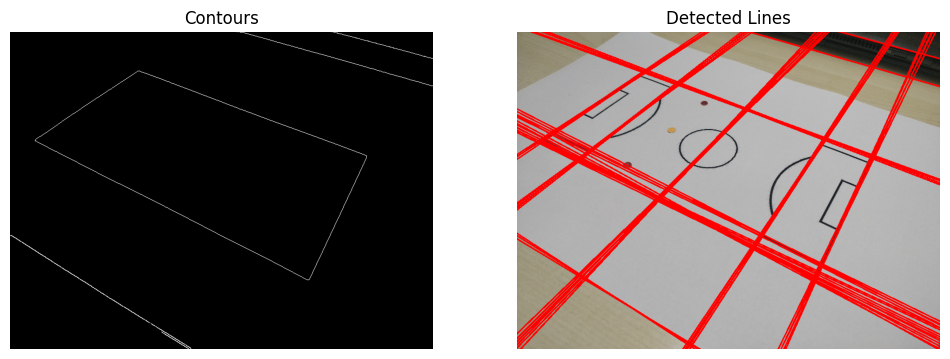

In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the soccer field image
# Define the maximum allowed display size
max_display_width = 800
max_display_height = 600

soccer_field_path = '/content/drive/MyDrive/cv_hw1_data/sf10.jpg'

soccer_field_img = cv2.imread(soccer_field_path)

# Resize images if they exceed the maximum display size
if soccer_field_img.shape[1] > max_display_width or soccer_field_img.shape[0] > max_display_height:
    soccer_field_img = cv2.resize(soccer_field_img, (max_display_width, max_display_height))

# Convert the soccer field image to grayscale
gray_soccer_field_img = cv2.cvtColor(soccer_field_img, cv2.COLOR_BGR2GRAY)

# Apply Gaussian blur to smooth the image (helps reduce noise)
blurred_img = cv2.GaussianBlur(gray_soccer_field_img, (5, 5), 0)

# Apply Canny edge detection
edges = cv2.Canny(blurred_img, 50, 150)

# Find contours in the edge-detected image
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create a blank image for drawing contours
contour_img = np.zeros_like(gray_soccer_field_img)

# Draw contours on the blank image
cv2.drawContours(contour_img, contours, -1, (255), 1)

# Detect lines using Hough Line Transform
lines = cv2.HoughLines(edges, 1, np.pi / 180, 100)

# Draw the detected lines on the original image
if lines is not None:
    for rho, theta in lines[:, 0]:
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))
        cv2.line(soccer_field_img, (x1, y1), (x2, y2), (0, 0, 255), 2)

# Plot the images side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(contour_img, cmap='gray')
axes[0].set_title('Contours')
axes[0].axis('off')
axes[1].imshow(cv2.cvtColor(soccer_field_img, cv2.COLOR_BGR2RGB))
axes[1].set_title('Detected Lines')
axes[1].axis('off')
plt.show()

<ipython-input-12-d684ab351bed>:16: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return int(x0), int(y0)


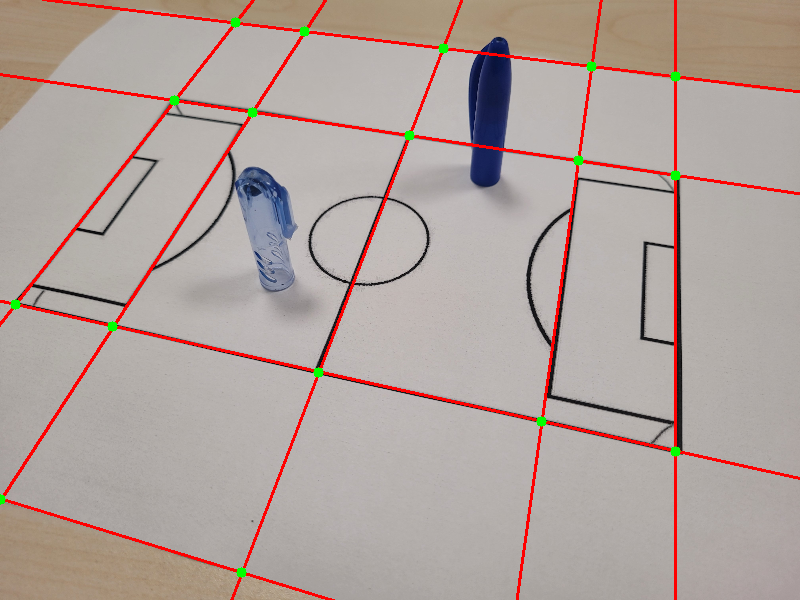

In [12]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Function to find intersection point of two lines
def find_intersection(line1, line2):
    rho1, theta1 = line1
    rho2, theta2 = line2

    A = np.array([
        [np.cos(theta1), np.sin(theta1)],
        [np.cos(theta2), np.sin(theta2)]
    ])
    b = np.array([[rho1], [rho2]])
    x0, y0 = np.linalg.solve(A, b)
    return int(x0), int(y0)

# Load the soccer field image
soccer_field_path = '/content/drive/MyDrive/cv_hw1_data/sf9.jpg'

soccer_field_img = cv2.imread(soccer_field_path)

# Define the maximum allowed display size
max_display_width = 800
max_display_height = 600

# Resize images if they exceed the maximum display size
if soccer_field_img.shape[1] > max_display_width or soccer_field_img.shape[0] > max_display_height:
    soccer_field_img = cv2.resize(soccer_field_img, (max_display_width, max_display_height))

# Convert the soccer field image to grayscale
gray_soccer_field_img = cv2.cvtColor(soccer_field_img, cv2.COLOR_BGR2GRAY)

# Apply edge detection to the grayscale image
edges = cv2.Canny(gray_soccer_field_img, 50, 150, apertureSize=3)

# Detect lines using Hough Line Transform
lines = cv2.HoughLines(edges, 1, np.pi / 180, 150)

if lines is not None:
    lines = np.squeeze(lines)
    lines_rho_theta = [(rho, theta) for rho, theta in lines]

    # Sort lines by rho and theta
    lines_rho_theta.sort(key=lambda x: (x[0], x[1]))

    # Define threshold values for rho and theta differences
    rho_threshold = 20
    theta_threshold = np.pi / 180 * 10

    # Merge lines with close proximity and similar orientation
    merged_lines = []
    prev_rho, prev_theta = lines_rho_theta[0]
    for rho, theta in lines_rho_theta[1:]:
        rho_diff = abs(rho - prev_rho)
        theta_diff = abs(theta - prev_theta)
        if rho_diff < rho_threshold and theta_diff < theta_threshold:
            # Merge lines by averaging rho and theta
            prev_rho = (prev_rho + rho) / 2
            prev_theta = (prev_theta + theta) / 2
        else:
            # Add the merged line to the list
            merged_lines.append((prev_rho, prev_theta))
            prev_rho, prev_theta = rho, theta

    # Add the last merged line
    merged_lines.append((prev_rho, prev_theta))

# Draw the detected lines on the original image
if merged_lines is not None:
    for rho, theta in merged_lines:
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))
        cv2.line(soccer_field_img, (x1, y1), (x2, y2), (0, 0, 255), 2)

    # Find intersection points of lines
    corners = []
    for i in range(len(merged_lines)):
        for j in range(i + 1, len(merged_lines)):
            intersection_point = find_intersection(merged_lines[i], merged_lines[j])
            corners.append(intersection_point)

    # Filter out nearby intersection points
    filtered_corners = []
    for corner in corners:
        add_corner = True
        for existing_corner in filtered_corners:
            if np.linalg.norm(np.array(corner) - np.array(existing_corner)) < 20:
                add_corner = False
                break
        if add_corner:
            filtered_corners.append(corner)

    # Draw the intersection points on the original image
    for corner in filtered_corners:
        cv2.circle(soccer_field_img, corner, 5, (0, 255, 0), -1)


# Display the original image with detected lines
cv2_imshow(soccer_field_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

## Solution using point at infinity and custom homography calculation

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_dots(hsv_img, lower_clr, upper_clr):
    # Create a mask to isolate given color regions
    clr_mask = cv2.inRange(hsv_img, lower_clr, upper_clr)

    # Find contours in the color mask
    contours, _ = cv2.findContours(clr_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Filter contours based on area
    filtered_contours = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if area > 30:  # Adjust the threshold based on your image
            filtered_contours.append(contour)

    # Extract centroids of the remaining contours (target dots)
    dot_coordinates = []
    for contour in filtered_contours:
        # Calculate centroid of contour
        M = cv2.moments(contour)
        if M["m00"] != 0:
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])
            dot_coordinates.append((cx, cy))

    return dot_coordinates

def detect_red_dots(hsv_img):
    # Define lower and upper range for red color in HSV
    lower_red = np.array([0, 100, 100])
    upper_red = np.array([20, 255, 255])
    dots = detect_dots(hsv_img, lower_red, upper_red)
    if len(dots) > 2:
        sorted_dots = sorted(dots, key=lambda x: x[0])
        dots = [sorted_dots[0], sorted_dots[-1]]
    return dots

def detect_green_dots(hsv_img):
    # Define lower and upper range for green color in HSV
    lower_green = np.array([35, 50, 50])
    upper_green = np.array([85, 255, 255])
    return detect_dots(hsv_img, lower_green, upper_green)

def preprocess_img(img):
    # Define the maximum allowed display size
    max_display_width = 700
    max_display_height = 400

    # Resize images if they exceed the maximum display size
    if img.shape[1] > max_display_width or img.shape[0] > max_display_height:
        img = cv2.resize(img, (max_display_width, max_display_height))

    return img

def order_dots(red_dot_coordinates, green_dot_coordinates):
    # Comparing the height of the dots (y values)
    if green_dot_coordinates[0][1] < green_dot_coordinates[1][1]:
        upper_green = green_dot_coordinates[0]
        lower_green = green_dot_coordinates[1]
    else:
        upper_green = green_dot_coordinates[1]
        lower_green = green_dot_coordinates[0]

    if red_dot_coordinates[0][1] < red_dot_coordinates[1][1]:
        upper_red = red_dot_coordinates[0]
        lower_red = red_dot_coordinates[1]
    else:
        upper_red = red_dot_coordinates[1]
        lower_red = red_dot_coordinates[0]

    if upper_green[0] < upper_red[0]:
        return [upper_green, upper_red, lower_red, lower_green]
    else:
        return [upper_green, lower_red, upper_red, lower_green]

def capture_soccer_field(soccer_field_path):
    soccer_field_img = cv2.imread(soccer_field_path)

    soccer_field_img = preprocess_img(soccer_field_img)

    # Convert the image to the HSV color space
    hsv_img = cv2.cvtColor(soccer_field_img, cv2.COLOR_BGR2HSV)

    # Detect the corners
    red_dot_coordinates = detect_red_dots(hsv_img)
    green_dot_coordinates = detect_green_dots(hsv_img)

    if len(red_dot_coordinates) < 2 or len(green_dot_coordinates) < 2:
        # Corners couldn't be detected
        return soccer_field_img, np.array([])

    ordered_dots = order_dots(red_dot_coordinates, green_dot_coordinates)
    # print("Red: ")
    # draw_circles_around_dots(soccer_field_img, red_dot_coordinates)

    # print("Green: ")
    # draw_circles_around_dots(soccer_field_img, green_dot_coordinates)
    # Display the soccer field image with marked corners

    # Convert the image back to BGR color space
    soccer_field_img_bgr = cv2.cvtColor(hsv_img, cv2.COLOR_HSV2BGR)

    # print(ordered_dots)
    # plt.figure(figsize=(10, 8))
    # plt.imshow(cv2.cvtColor(soccer_field_img_bgr, cv2.COLOR_BGR2RGB))
    # plt.title('Soccer Field with Marked Corners')
    # plt.xlabel('X-coordinate')
    # plt.ylabel('Y-coordinate')
    # plt.show()

    return soccer_field_img_bgr, np.array(ordered_dots)


def draw_circles_around_dots(img, dot_coordinates):
    for cx, cy in dot_coordinates:
        print(cx, cy)
        cv2.circle(img, (cx, cy), 10, (255, 0, 0), -1)

def line_coefficients(p1, p2):
    x1, y1 = p1
    x2, y2 = p2

    # Calculate slope
    m = (y2 - y1) / (x2 - x1)

    # Rearrange the equation of the line to ax + by + c = 0 form
    a = m
    b = -1
    c = y1 - m * x1

    return a, b, c

def get_intersection_point(line1, line2):
    # The cross product of homogeneous representation of two lines gives the intersection point (vanishing point at infinity)
    intersection_homogeneous = np.cross(line1, line2)

    # If the third component is not zero, normalize the vector
    if intersection_homogeneous[2] != 0:
        intersection_homogeneous /= intersection_homogeneous[2]
    print("intersection point: ", intersection_homogeneous)
    return intersection_homogeneous

def get_point_at_infinity(pts):
    # Use the intersection of parallel lines
    l1 = line_coefficients(pts[0], pts[1])
    l2 = line_coefficients(pts[2], pts[3])

    # l1 and l2 are parallel
    return get_intersection_point(l1, l2)

def convert_homogeneous_coords(pts):
    homo_pts = []
    for p in pts:
        x, y = p
        homo_pts.append((x, y, 1))
    return homo_pts

def find_4th_point_at_infinity(pts):
    pts_homo = convert_homogeneous_coords(pts)

    # Use the intersection of parallel lines at infinity
    p4 = get_point_at_infinity(pts)

    return pts_homo[:-1] + [p4]

def calculate_homography(points1, points2):
    # Constructing the matrix A
    A = []
    for (x, y, z), (x_prime, y_prime, z_prime) in zip(points1, points2):
        A.append([-x, -y, -z, 0, 0, 0, x * x_prime, y * x_prime, z * x_prime])
        A.append([0, 0, 0, -x, -y, -z, x * y_prime, y * y_prime, z * y_prime])
    A = np.array(A)

    # Solve the linear system using SVD
    _, _, V = np.linalg.svd(A)
    h = V[-1] / V[-1, -1]  # Normalize to make h33 = 1
    H = h.reshape(3, 3)

    return H

def transform_soccer_field(soccer_field_path, bird_eye_view_path, display_output=True):
    soccer_field_img, src_pts = capture_soccer_field(soccer_field_path)
    bird_eye_view_img, dst_pts = capture_soccer_field(bird_eye_view_path)

    if not src_pts.any():
        print(f"(!) Corners on the {soccer_field_path} couldn't be detected")
    elif not dst_pts.any():
        print(f"(!) Corners on the {bird_eye_view_path} couldn't be detected")
    else:

        # src_pts_inf = find_4th_point_at_infinity(src_pts)
        # dst_pts_inf = find_4th_point_at_infinity(dst_pts)
        # H = calculate_homography(src_pts_inf, dst_pts_inf)

        # Compute Homography
        H, _ = cv2.findHomography(src_pts, dst_pts)

        # Warp the soccer field image using the computed homography
        transformed_img = cv2.warpPerspective(soccer_field_img, H, (bird_eye_view_img.shape[1], bird_eye_view_img.shape[0]))

        if display_output:
            print("Homography Matrix:\n", H, "\n")

            # Plot the transformed image
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(soccer_field_img, cv2.COLOR_BGR2RGB))
            plt.title('Soccer Field Image')

            plt.subplot(1, 2, 2)
            plt.imshow(cv2.cvtColor(transformed_img, cv2.COLOR_BGR2RGB))
            plt.title('Transformed Soccer Field Image')
            plt.show()

        return soccer_field_img, transformed_img, H

/content/drive/MyDrive/cv_hw1_data/sf1.jpeg
Homography Matrix:
 [[ 1.55186703e+00  1.38765301e+00 -2.65018180e+02]
 [-7.16740397e-01  2.23385566e+00  6.39703196e+01]
 [-1.32295146e-04  1.43136695e-03  1.00000000e+00]] 



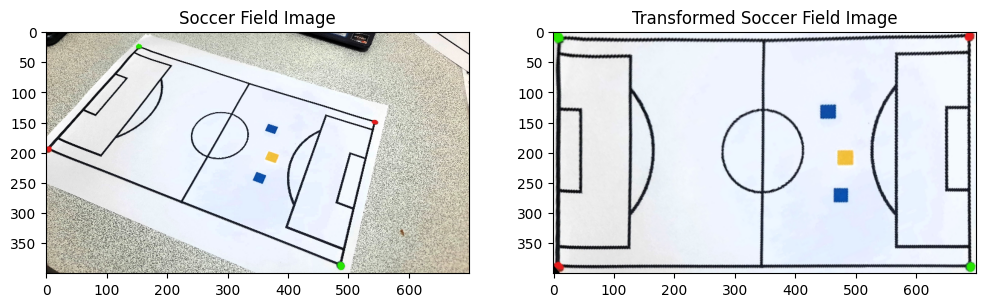

/content/drive/MyDrive/cv_hw1_data/sf2.jpeg
Homography Matrix:
 [[-2.20202484e-01  3.64418960e+00 -3.97445958e+01]
 [-2.00472116e+00  7.03866624e-01  8.22473760e+02]
 [-3.97826641e-04  2.39320908e-03  1.00000000e+00]] 



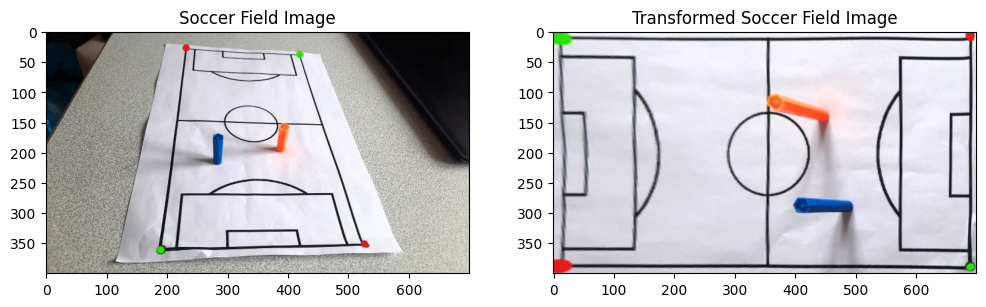

/content/drive/MyDrive/cv_hw1_data/sf3.jpeg
Homography Matrix:
 [[ 1.60005131e+00  4.99244373e-01 -2.26433205e+02]
 [-1.64178963e-01  1.98411701e+00 -5.72714073e+01]
 [-4.44783041e-05  8.90991750e-04  1.00000000e+00]] 



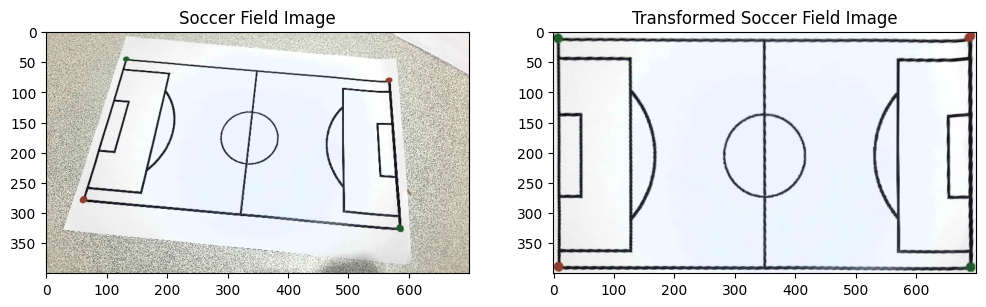

/content/drive/MyDrive/cv_hw1_data/sf4.jpeg
Homography Matrix:
 [[ 1.41619620e+00 -2.37849334e-01 -6.97821515e+01]
 [ 4.83496876e-01  2.64272627e+00 -3.16814112e+02]
 [-3.05298773e-04  2.28215713e-03  1.00000000e+00]] 



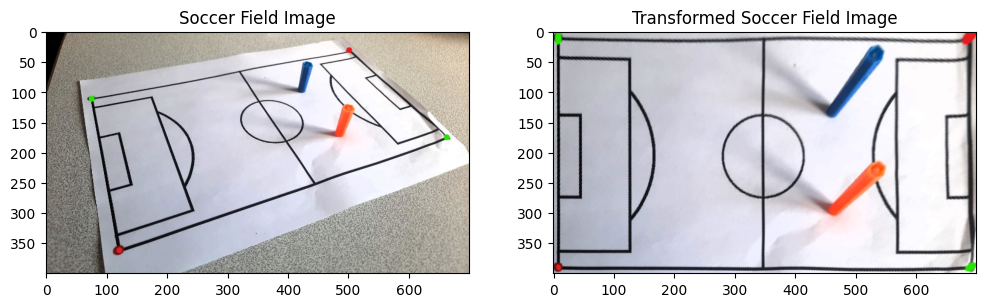

/content/drive/MyDrive/cv_hw1_data/sf5.jpeg
Homography Matrix:
 [[ 1.64629207e+00  1.54558638e+00 -3.11597860e+02]
 [-6.56335274e-01  2.36982154e+00  1.19427198e+02]
 [ 8.21565765e-05  1.67736112e-03  1.00000000e+00]] 



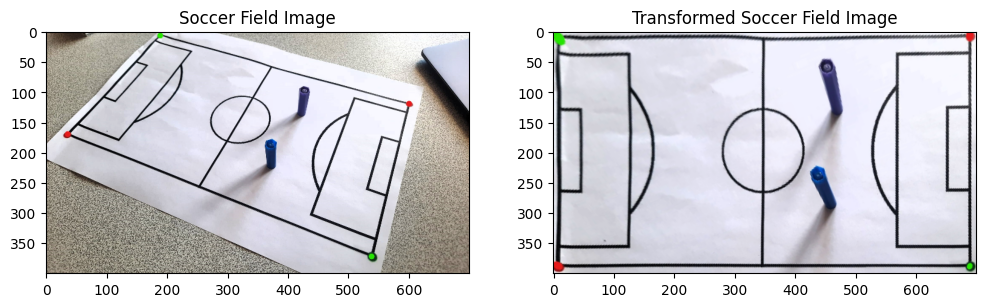

/content/drive/MyDrive/cv_hw1_data/sf6.jpeg
Homography Matrix:
 [[ 1.55106876e+00  1.26640072e+00 -2.69258860e+02]
 [-7.62734665e-01  2.01808289e+00  1.32567001e+02]
 [-6.38702220e-05  1.05435820e-03  1.00000000e+00]] 



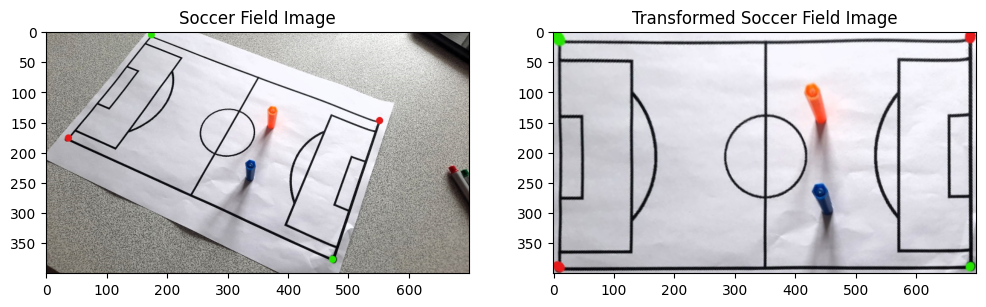

/content/drive/MyDrive/cv_hw1_data/sf7.jpeg
Homography Matrix:
 [[-1.41900084e-01  3.42663871e+00 -4.24572035e+01]
 [-2.16218111e+00  3.84655232e-01  9.16457574e+02]
 [-1.75249904e-04  1.82619524e-03  1.00000000e+00]] 



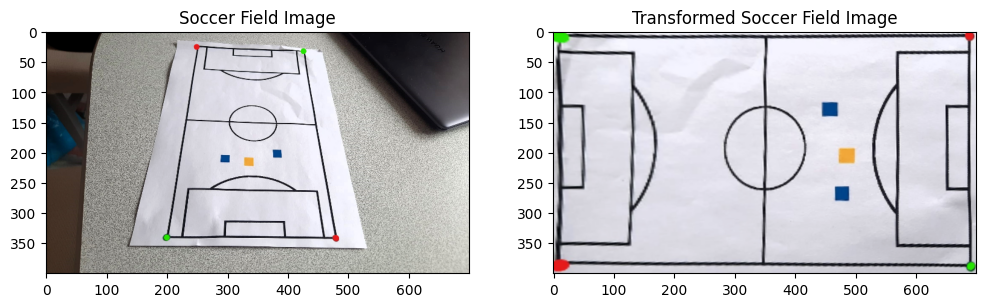

/content/drive/MyDrive/cv_hw1_data/sf8.jpeg
Homography Matrix:
 [[ 7.10976131e-01  5.43394465e-01 -1.64105431e+02]
 [-5.45688351e-01  1.40669467e+00  8.17149837e+01]
 [-1.07517370e-03  1.00369848e-03  1.00000000e+00]] 



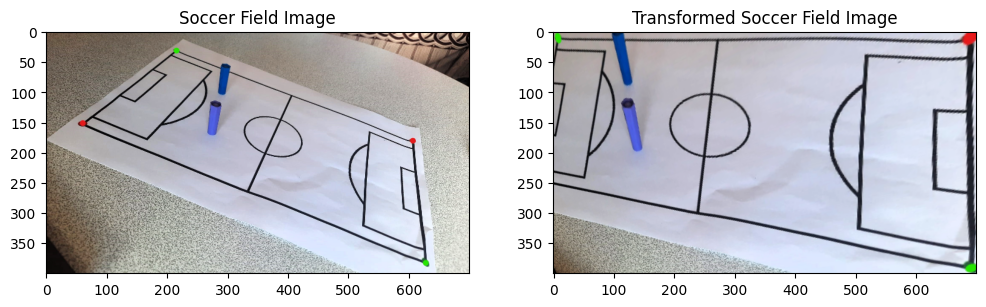

In [4]:
DATA = '/content/drive/MyDrive/cv_hw1_data'
bird_eye_view_path = f'{DATA}/soccer_field_bird_eye_view.jpg'

for i in range(1, 9):
    soccer_field_path = f'{DATA}/sf{i}.jpeg'
    print(soccer_field_path)
    transform_soccer_field(soccer_field_path, bird_eye_view_path)

# Part 2

## Attepts

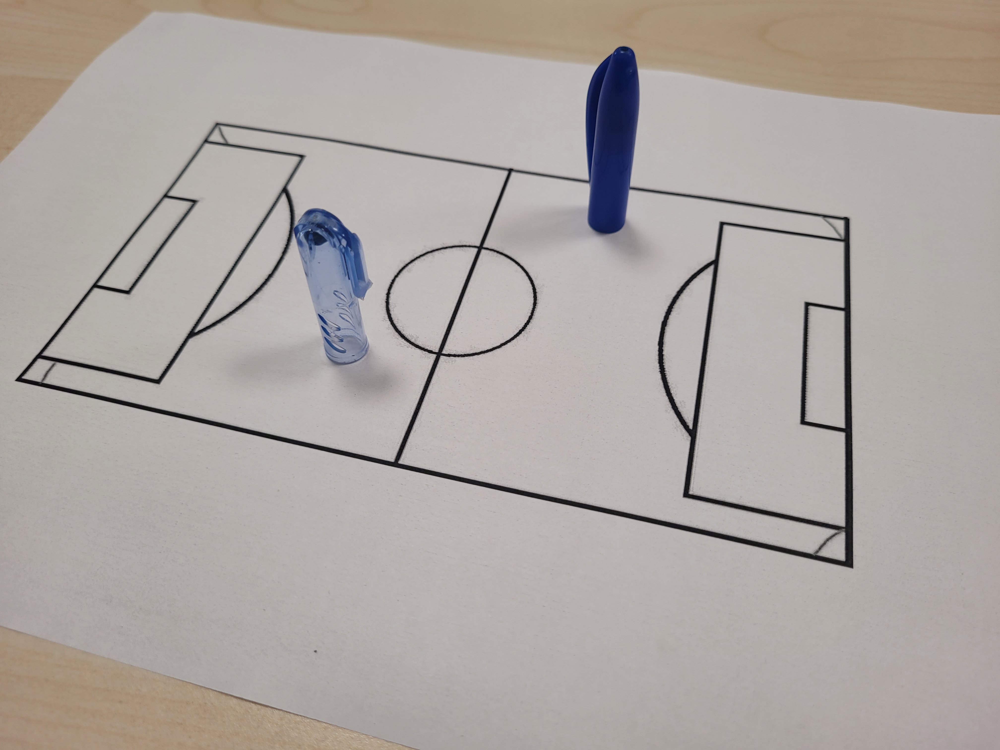

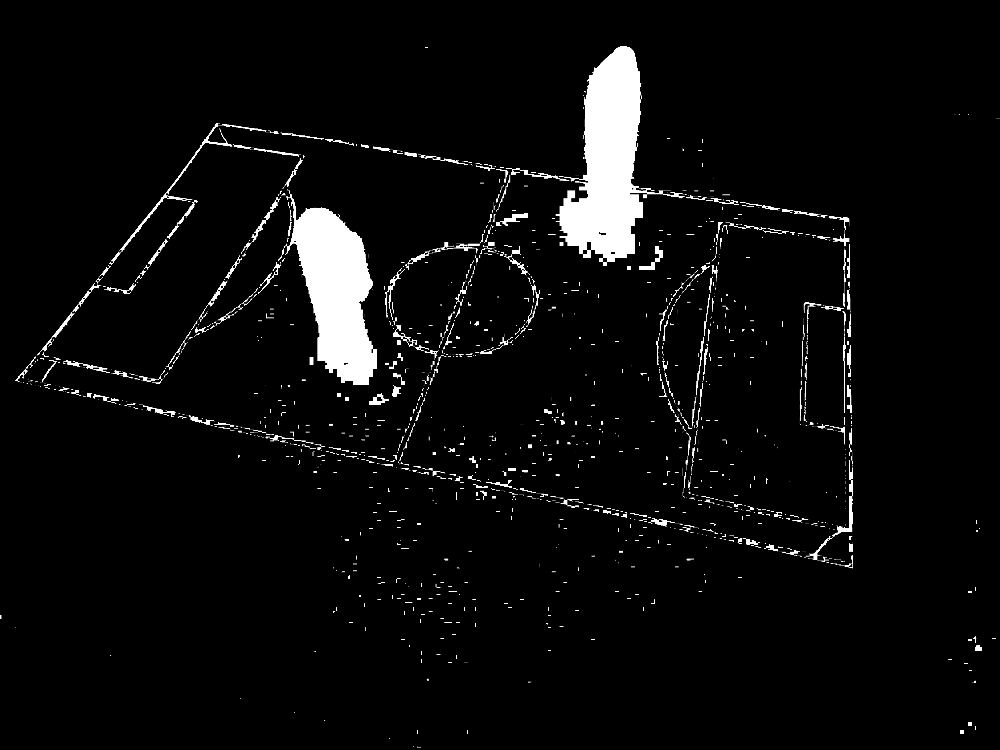

In [19]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

source_path = '/content/drive/MyDrive/cv_hw1_data/sf9.jpg'

# Load source image
source_img = cv2.imread(source_path)  # Your input image with players

# Define color ranges for players
player_colors = [
    ([0, 0, 100], [100, 100, 255]),  # Red player
    ([0, 100, 0], [100, 255, 100]),  # Green player
    ([100, 0, 0], [255, 100, 100])   # Blue player
]

# Convert source image to HSV color space
hsv_img = cv2.cvtColor(source_img, cv2.COLOR_BGR2HSV)

# Create an empty mask
player_mask = np.zeros((source_img.shape[0], source_img.shape[1]), dtype=np.uint8)

# Iterate through player colors and create mask for each color
for (lower, upper) in player_colors:
    lower = np.array(lower, dtype=np.uint8)
    upper = np.array(upper, dtype=np.uint8)
    player_mask += cv2.inRange(hsv_img, lower, upper)


# Apply morphology to remove small noise
player_mask = cv2.morphologyEx(player_mask, cv2.MORPH_OPEN, np.ones((5, 5), np.uint8))

# Invert the mask (players are now white, soccer field is black)
player_mask = cv2.bitwise_not(player_mask)

# Display the binary mask
cv2_imshow(source_img)

cv2_imshow(player_mask)
cv2.waitKey(0)
cv2.destroyAllWindows()

## Solution

In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

def is_overlapping(img, x, y):
    # Define the threshold for considering a pixel as part of the player
    threshold = 180  # Adjust as needed

    # Get the pixel value in grayscale
    pixel_value = img[y, x]

    # Check if the pixel is close to white
    if pixel_value > threshold:
        return False  # Pixel is close to white, indicating it doesn't overlap with the player
    else:
        return True  # Pixel is part of the player

# Function to create a circular mask
def create_circle_mask(img_shape, center, radius):
    mask = np.zeros(img_shape[:2], dtype=np.uint8)
    cv2.circle(mask, center, radius, 255, -1)  # Draw filled circle
    return mask

def draw_circle_around_players(contours, gray_img, transformed_img, seed=75):
    # Set the seed for random number generation
    np.random.seed(seed)
    for i, contour in enumerate(contours, start=1):
        # Generate a unique color for each player
        color = tuple(map(int, np.random.randint(0, 255, size=3)))
        # Calculate the centroid of the contour
        M = cv2.moments(contour)
        if M["m00"] != 0:
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])

            radius = 60
            for dx in range(-radius, radius + 1):
                # Calculate the length of the beam
                b = int(math.sqrt(radius**2 - abs(dx)**2))
                for dy in range(-b, b + 1):
                    x = cx + dx
                    y = cy + dy
                    if 0 <= x < gray_img.shape[1] and 0 <= y < gray_img.shape[0] and not is_overlapping(gray_img, x, y):
                        cv2.circle(transformed_img, (x, y), 1, color, -1)

def detect_players(soccer_field_path, bird_eye_view_path):
    # Transform the soccer field to bird eye view
    soccer_field_img, transformed_img, H = transform_soccer_field(soccer_field_path, bird_eye_view_path, display_output=False)

    gray_img = cv2.cvtColor(transformed_img, cv2.COLOR_BGR2GRAY)
    hsv_img = cv2.cvtColor(transformed_img, cv2.COLOR_BGR2HSV)

    # Define lower and upper range for orange color in HSV
    lower_orange = np.array([0, 100, 100])
    upper_orange = np.array([20, 255, 255])
    # Create a mask to isolate orange regions
    orange_mask = cv2.inRange(hsv_img, lower_orange, upper_orange)

    # Define lower and upper range for purple color in HSV
    lower_purple = np.array([120, 50, 50])
    upper_purple = np.array([160, 255, 255])
    # Create a mask to isolate purple regions
    purple_mask = cv2.inRange(hsv_img, lower_purple, upper_purple)

    # Define lower and upper range for blue color in HSV
    lower_blue = np.array([100, 100, 100])
    upper_blue = np.array([120, 255, 255])
    # Create a mask to isolate blue regions
    blue_mask = cv2.inRange(hsv_img, lower_blue, upper_blue)

    # Combine the masks to detect both orange and blue players
    players_mask = cv2.bitwise_or(orange_mask, blue_mask)
    players_mask = cv2.bitwise_or(players_mask, purple_mask)

    # Find contours in the combined mask
    players_contours, _ = cv2.findContours(players_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Filter contours based on area (size) to remove noise
    min_player_area = 500
    players_filtered_contours = [contour for contour in players_contours if cv2.contourArea(contour) > min_player_area]

    draw_circle_around_players(players_filtered_contours, gray_img, transformed_img)

    # Inverse transform the result image
    inverse_transformed_img = cv2.warpPerspective(transformed_img, np.linalg.inv(H), (transformed_img.shape[1], transformed_img.shape[0]))

    # Replace black regions in the inverse transformed image with corresponding pixels from the original image
    for y in range(inverse_transformed_img.shape[0]):
        for x in range(inverse_transformed_img.shape[1]):
            if np.all(inverse_transformed_img[y, x] == [0, 0, 0]):
                inverse_transformed_img[y, x] = soccer_field_img[y, x]

    # Convert the image from BGR to RGB for displaying with matplotlib
    inverse_transformed_img_rgb = cv2.cvtColor(inverse_transformed_img, cv2.COLOR_BGR2RGB)

    # Display all three images side by side
    plt.figure(figsize=(15, 5))

    # Display soccer_field_img
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(soccer_field_img, cv2.COLOR_BGR2RGB))
    plt.title('Soccer Field Image')
    plt.axis('off')

    # Display transformed_img
    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(transformed_img, cv2.COLOR_BGR2RGB))
    plt.title('Transformed Image')
    plt.axis('off')

    # Display inverse_transformed_img
    plt.subplot(1, 3, 3)
    plt.imshow(inverse_transformed_img_rgb)
    plt.title('Inverse Transformed Image')
    plt.axis('off')

    plt.show()

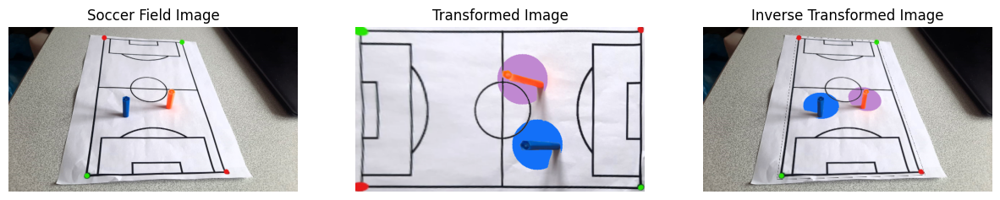

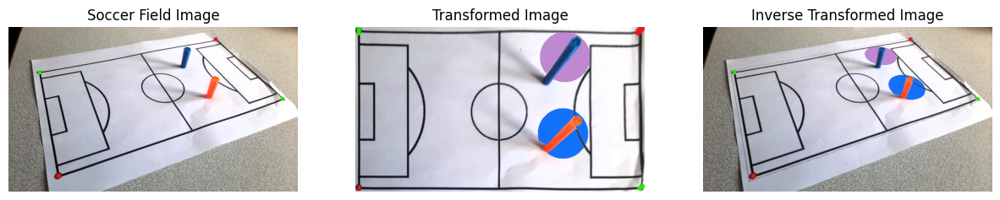

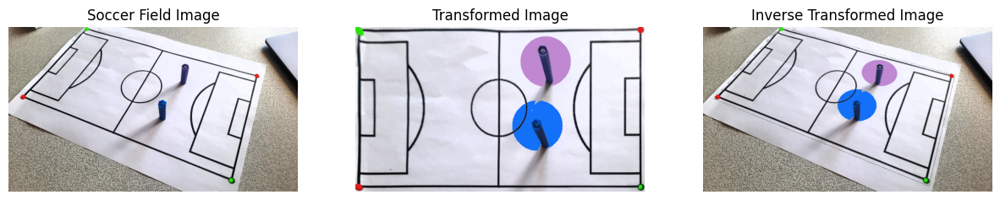

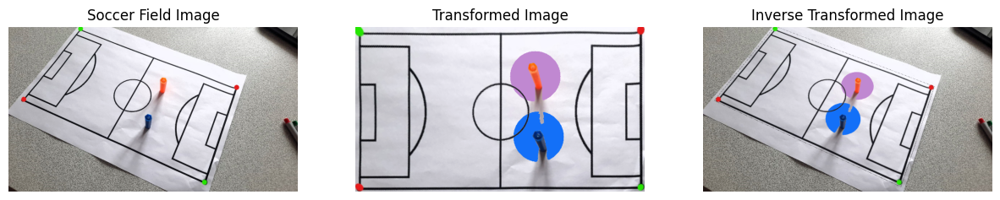

In [21]:
# Load the soccer field image
DATA = '/content/drive/MyDrive/cv_hw1_data'
bird_eye_view_path = f'{DATA}/soccer_field_bird_eye_view.jpg'

# Images with players
img_ids = [2, 4, 5, 6]

for i in img_ids:
    soccer_field_path = f'{DATA}/sf{i}.jpeg'
    detect_players(soccer_field_path, bird_eye_view_path)